Instala a biblioteca pandas-profiling, responsável por produzir um relatório dos dados.

In [ ]:
!pip install -q --upgrade pandas-profiling

     |████████████████████████████████| 266kB 4.4MB/s 
     |████████████████████████████████| 604kB 14.5MB/s 
     |████████████████████████████████| 71kB 8.5MB/s 
     |████████████████████████████████| 61kB 7.8MB/s 
     |████████████████████████████████| 71kB 8.3MB/s 
     |████████████████████████████████| 3.1MB 17.4MB/s 
     |████████████████████████████████| 296kB 35.0MB/s 


Importa as bibliotecas necessárias.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.datasets import load_iris, load_wine
from sklearn.model_selection import cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
import pandas as pd
from pandas_profiling import ProfileReport
import numpy as np

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [ ]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set_style("whitegrid", {"grid.linestyle":"--"})

<h1>Carrega os dados</h1>

In [ ]:
iris_data = load_iris()

In [ ]:
wine_data = load_wine()

#Inspeciona os dados.

<h2>Iris dataset</h2>

In [ ]:
iris_data.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2])

In [ ]:
iris_data.target_names

array(['setosa', 'versicolor', 'virginica'], dtype='<U10')

In [ ]:
iris_data.data

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2],
       [5.4, 3.9, 1.7, 0.4],
       [4.6, 3.4, 1.4, 0.3],
       [5. , 3.4, 1.5, 0.2],
       [4.4, 2.9, 1.4, 0.2],
       [4.9, 3.1, 1.5, 0.1],
       [5.4, 3.7, 1.5, 0.2],
       [4.8, 3.4, 1.6, 0.2],
       [4.8, 3. , 1.4, 0.1],
       [4.3, 3. , 1.1, 0.1],
       [5.8, 4. , 1.2, 0.2],
       [5.7, 4.4, 1.5, 0.4],
       [5.4, 3.9, 1.3, 0.4],
       [5.1, 3.5, 1.4, 0.3],
       [5.7, 3.8, 1.7, 0.3],
       [5.1, 3.8, 1.5, 0.3],
       [5.4, 3.4, 1.7, 0.2],
       [5.1, 3.7, 1.5, 0.4],
       [4.6, 3.6, 1. , 0.2],
       [5.1, 3.3, 1.7, 0.5],
       [4.8, 3.4, 1.9, 0.2],
       [5. , 3. , 1.6, 0.2],
       [5. , 3.4, 1.6, 0.4],
       [5.2, 3.5, 1.5, 0.2],
       [5.2, 3.4, 1.4, 0.2],
       [4.7, 3.2, 1.6, 0.2],
       [4.8, 3.1, 1.6, 0.2],
       [5.4, 3.4, 1.5, 0.4],
       [5.2, 4.1, 1.5, 0.1],
       [5.5, 4.2, 1.4, 0.2],
       [4.9, 3

In [ ]:
iris_data.feature_names

['sepal length (cm)',
 'sepal width (cm)',
 'petal length (cm)',
 'petal width (cm)']

In [ ]:
df_iris = pd.DataFrame(iris_data.data, columns=iris_data.feature_names)

In [ ]:
df_iris["target"] = iris_data.target

In [ ]:
df_iris.head()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
0,5.1,3.5,1.4,0.2,0
1,4.9,3.0,1.4,0.2,0
2,4.7,3.2,1.3,0.2,0
3,4.6,3.1,1.5,0.2,0
4,5.0,3.6,1.4,0.2,0


A ferramenta profile apresenta de forma simplificada várias informações importantes, como ocorrência de exemplos duplicados, presença de valores ausentes, estatísticas descritivas e correlações.

In [ ]:
profile_iris = ProfileReport(df_iris)

In [ ]:
profile_iris.to_notebook_iframe()

O relatório acima mostra que existe uma instância duplicada. Confirma se existem exemplos duplicados.

In [ ]:
df_iris.duplicated().any()

True

Quantidade de exemplos duplicados.

In [ ]:
df_iris.duplicated().sum()

1

Qual é a amostra duplicada?

In [ ]:
df_iris[df_iris.duplicated()]

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm),target
142,5.8,2.7,5.1,1.9,2


Como há somente uma amostra duplicada, a mesma poderia ser removida facilmente com a função drop do pandas. Porém, usarei uma função específica para descartar valores duplicados. 

In [ ]:
df_iris.drop_duplicates(inplace=True)

Verifica a ocorrência de valores ausentes.



In [ ]:
df_iris.isna().sum()

sepal length (cm)    0
sepal width (cm)     0
petal length (cm)    0
petal width (cm)     0
target               0
dtype: int64

Distribuição dos dados, exceto para a última coluna, a classe.

In [ ]:
df_iris.iloc[:,:-1].describe()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
count,149.000000,149.000000,149.000000,149.000000
mean,5.843624,3.059732,3.748993,1.194631
std,0.830851,0.436342,1.767791,0.762622
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.300000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


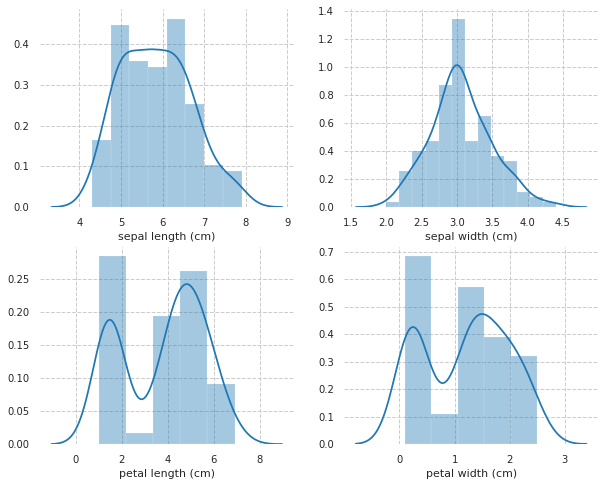

In [ ]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
sns.distplot(df_iris.iloc[:,0], ax=ax[0,0])
sns.distplot(df_iris.iloc[:,1], ax=ax[0,1])
sns.distplot(df_iris.iloc[:,2], ax=ax[1,0])
sns.distplot(df_iris.iloc[:,3], ax=ax[1,1])

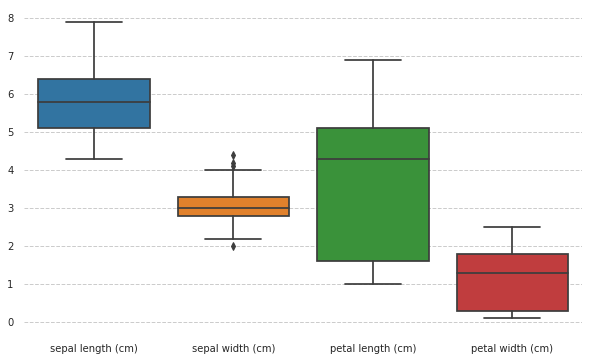

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df_iris.iloc[:,:-1])

O boxplot acima sugere que existem outliers para o atributo "sepal width".

Checa se os dados estão balanceados.

In [ ]:
df_iris.groupby(by="target").count()

,sepal length (cm),sepal width (cm),petal length (cm),petal width (cm)
target,,,,
0,50,50,50,50
1,50,50,50,50
2,49,49,49,49


As amostras de dados estão bem divididas entre as três classes de flores.

<h2>Wine dataset</h2>

In [ ]:
wine_data.data

array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 1.030e+00, 3.170e+00,
        1.185e+03],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 5.900e-01, 1.560e+00,
        8.350e+02],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 6.000e-01, 1.620e+00,
        8.400e+02],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 6.100e-01, 1.600e+00,
        5.600e+02]])

In [ ]:
wine_data.target

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2])

In [ ]:
df_wine = pd.DataFrame(wine_data.data, columns=wine_data.feature_names)

In [ ]:
df_wine["target"] = wine_data.target

In [ ]:
df_wine.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [ ]:
profile_wine = ProfileReport(df_wine)

In [ ]:
profile_wine.to_notebook_iframe()

Existem amostras duplicadas?

In [ ]:
df_wine.duplicated().any()

False

Não existem exemplos duplicados no dataset wine.

Valores ausentes.

In [ ]:
df_wine.isna().sum()

alcohol                         0
malic_acid                      0
ash                             0
alcalinity_of_ash               0
magnesium                       0
total_phenols                   0
flavanoids                      0
nonflavanoid_phenols            0
proanthocyanins                 0
color_intensity                 0
hue                             0
od280/od315_of_diluted_wines    0
proline                         0
target                          0
dtype: int64

In [ ]:
df_wine.describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,target
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258,0.938202
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474,0.775035
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000,0.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000,0.000000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000,1.000000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000,2.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000,2.000000


Como o dataset wine contém 13 colunas, analiso quais atributos são mais relevantes, posteriormente serão apresentados gráficos com esses atributos.

Seleção dos atributos mais importantes.

In [ ]:
clf = RandomForestClassifier()

In [ ]:
clf.fit(wine_data.data, wine_data.target)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [ ]:
df_importance = pd.DataFrame({"importance":clf.feature_importances_, "features":wine_data.feature_names}).sort_values(by="importance", ascending=False)

O gráfico abaixo mostra uma comparação entre a importância de cada atributo, ordenados do mais relevante para o menos importante. 

Text(0.5, 0, 'Importância (%)')

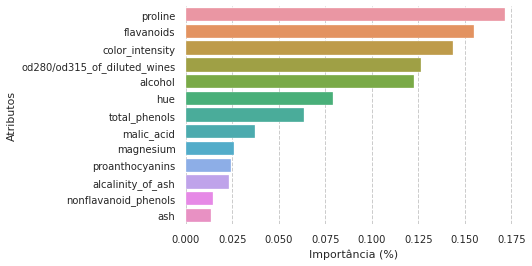

In [ ]:
sns.barplot(data=df_importance, x="importance", y="features")
plt.ylabel("Atributos")
plt.xlabel("Importância (%)")

#Distribuição de probabilidade dos atributos mais relevantes, com base na análise descrita acima.

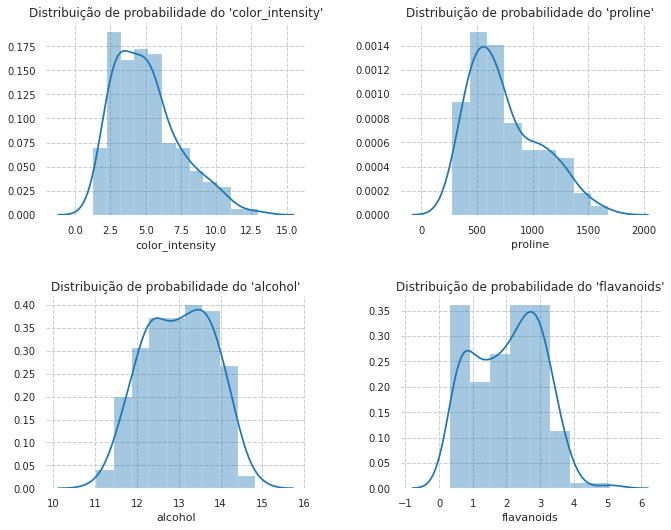

In [ ]:
fig, ax = plt.subplots(2,2,figsize=(10,8))
sns.distplot(df_wine.iloc[:,9], ax=ax[0,0])
sns.distplot(df_wine.iloc[:,12], ax=ax[0,1])
sns.distplot(df_wine.iloc[:,0], ax=ax[1,0])
sns.distplot(df_wine.iloc[:,6], ax=ax[1,1])
for ax, feature in zip([ax[0,0], ax[0,1], ax[1,0], ax[1,1]], ["color_intensity","proline", "alcohol", "flavanoids"]):
  ax.set_title("Distribuição de probabilidade do '{0}'".format(feature))
fig.tight_layout(pad=3)

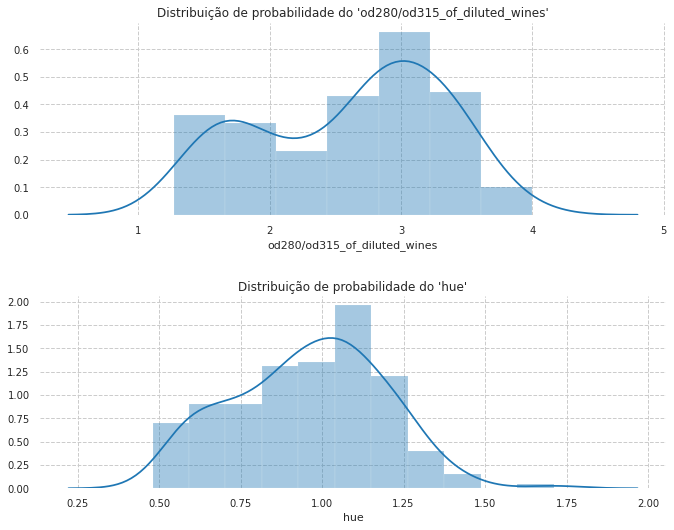

In [ ]:
fig, (ax1, ax2) = plt.subplots(2,1,figsize=(10,8))
sns.distplot(df_wine.iloc[:,11], ax=ax1)
sns.distplot(df_wine.iloc[:,10], ax=ax2)
for ax, feature in zip([ax1, ax2], ["od280/od315_of_diluted_wines","hue"]):
  ax.set_title("Distribuição de probabilidade do '{0}'".format(feature))
fig.tight_layout(pad=3)

Devido à diferença de escala dos atributos, precisei dividir a construção de boxplots.

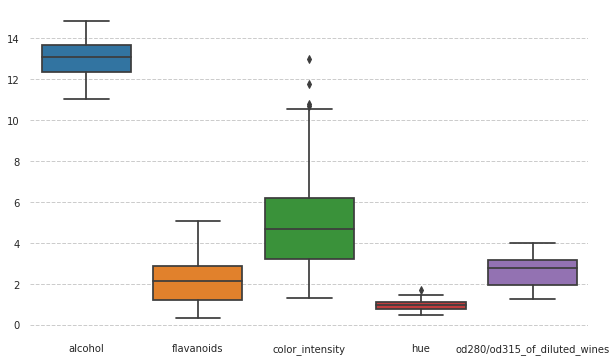

In [ ]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df_wine.iloc[:,[0,6,9,10,11]])

Alguns outliers podem ser observados na figura acima para os atributos "color_intensity" e "hue".

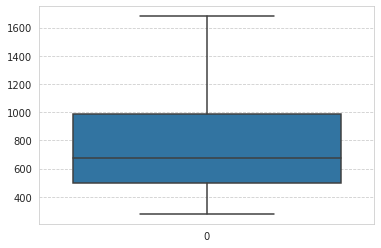

In [ ]:
sns.boxplot(data=df_wine.iloc[:,12])

O dataset está balanceado? 

In [ ]:
df_wine.groupby(by="target")["target"].count()/df_wine["target"].count()

target
0    0.331461
1    0.398876
2    0.269663
Name: target, dtype: float64

Os dados parecem balanceados entre as três classes de vinhos.

#Normaliza os dados

In [ ]:
scaler = MinMaxScaler(feature_range=[0,1])

In [ ]:
iris_data_scaled = scaler.fit_transform(iris_data.data)

In [ ]:
wine_data_scaled = scaler.fit_transform(wine_data.data)

#Instancia os classificadores


In [ ]:
rfc = RandomForestClassifier()
svm = SVC()
knn = KNeighborsClassifier(n_neighbors=5)

#Cross-validation

In [ ]:
classifiers = [rfc, svm, knn]

O código a seguir avalia os classificadores acima através de uma cross-validation, computa as métricas acurácia, precisão macro, recall macro e F1-score macro, constrói um dataframe com os resultados, por fim, coloca o desempenho das métricas no formato de porcentagem. 

#Iris dataset

In [ ]:
df_results_iris = pd.DataFrame()
for clf, clf_name in zip(classifiers, ["Random Forest", "SVM", "k-NN"]):
  clf_results_iris = cross_validate(clf, iris_data_scaled, iris_data.target, cv=10, scoring=["accuracy", "precision_macro", "recall_macro", "f1_macro"])
  metrics = list({x:np.mean(clf_results_iris[x]) for x in clf_results_iris}.keys())[2:] #exclui os tempos para treino e teste.
  performance = list({x:np.mean(clf_results_iris[x]) for x in clf_results_iris}.values())[2:]
  results_dict = {"metric":metrics, "performance":performance}
  df_temp = pd.DataFrame(results_dict)
  df_temp["classifier"] = clf_name
  df_results_iris = pd.concat([df_results_iris,df_temp])
df_results_iris["performance"] = df_results_iris["performance"] * 100

#Wine dataset

O código abaixo realiza a mesma tarefa do procedimento acima. Contudo, desta vez, mantive a construção do dataset em uma única linha.

In [ ]:
df_results_wine = pd.DataFrame()
for clf, clf_name in zip(classifiers, ["Random Forest", "SVM", "k-NN"]):
  clf_results_wine = cross_validate(clf, wine_data_scaled, wine_data.target, cv=10, scoring=["accuracy", "precision_macro", "recall_macro", "f1_macro"])
  df_temp = pd.DataFrame({"metric":list({x:np.mean(clf_results_wine[x]) for x in clf_results_wine}.keys())[2:], "performance":list({x:np.mean(clf_results_wine[x]) for x in clf_results_wine}.values())[2:]})
  df_temp["classifier"] = clf_name
  df_results_wine = pd.concat([df_results_wine,df_temp])
df_results_wine["performance"] = df_results_wine["performance"] * 100  

#Corrige o nome das métricas.

O código abaixo ajusta o nome das métricas para um formato mais amigável.

In [ ]:
for df in [df_results_iris, df_results_wine]:
  df["metric"].replace("test_accuracy", "Accuracy", inplace=True)
  df["metric"].replace("test_precision_macro", "Precision macro", inplace=True)
  df["metric"].replace("test_recall_macro", "Recall macro", inplace=True)
  df["metric"].replace("test_f1_macro", "F1 macro", inplace=True)

<h1>Apresentação dos resultados</h1>

Dataframe com os resultados para o dataset Iris.


In [ ]:
df_results_iris

,metric,performance,classifier
0,Accuracy,95.333333,Random Forest
1,Precision macro,95.833333,Random Forest
2,Recall macro,95.333333,Random Forest
3,F1 macro,95.286195,Random Forest
0,Accuracy,95.333333,SVM
1,Precision macro,95.833333,SVM
2,Recall macro,95.333333,SVM
3,F1 macro,95.286195,SVM
0,Accuracy,95.333333,k-NN
1,Precision macro,95.833333,k-NN


Dataframe com os resultados para o dataset wine.

In [ ]:
df_results_wine

,metric,performance,classifier
0,Accuracy,95.333333,Random Forest
1,Precision macro,95.833333,Random Forest
2,Recall macro,95.333333,Random Forest
3,F1 macro,95.286195,Random Forest
0,Accuracy,95.333333,SVM
1,Precision macro,95.833333,SVM
2,Recall macro,95.333333,SVM
3,F1 macro,95.286195,SVM
0,Accuracy,95.333333,k-NN
1,Precision macro,95.833333,k-NN


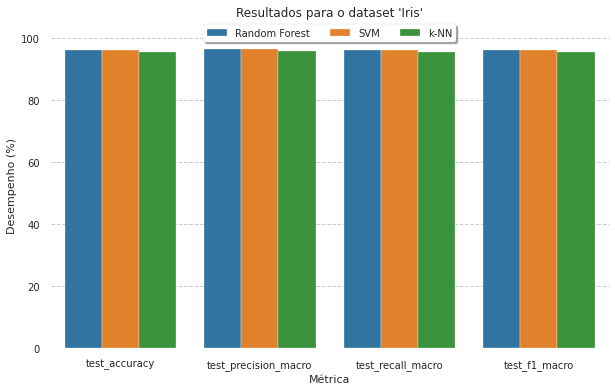

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(data=df_results_iris, x="metric", y="performance", hue="classifier")
plt.ylabel("Desempenho (%)")
plt.xlabel("Métrica")
plt.title("Resultados para o dataset 'Iris'")
plt.ylim(0,105)
plt.legend(loc='upper center', bbox_to_anchor=(0.5,1.01), ncol=3, fancybox=True, shadow=True)

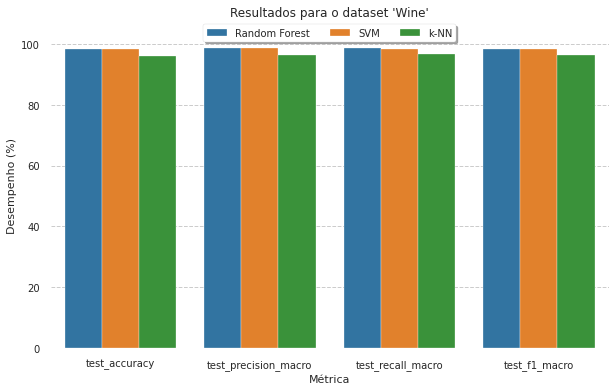

In [ ]:
plt.figure(figsize=(10,6))
sns.barplot(data=df_results_wine, x="metric", y="performance", hue="classifier")
plt.ylabel("Desempenho (%)")
plt.xlabel("Métrica")
plt.title("Resultados para o dataset 'Wine'")
plt.ylim(0,107)
plt.legend(loc='upper center', bbox_to_anchor=(0.5,1.01), ncol=3, fancybox=True, shadow=True)

#Conclusão

Com base nos resultados apresentados acima, o Random Forest superou os outros algoritmos em todas as métricas avaliadas. Os três algoritmos atingiram resultados bastante promissores, com valores acima de 95% para todas as métricas.